In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/face-mask-detection/annotations/maksssksksss737.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss410.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss537.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss295.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss771.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss234.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss620.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss70.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss281.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss393.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss296.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss756.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss260.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss57.xml
/kaggle/input/face-mask-detection/annotations/maksssksksss224.xml
/kaggle/inpu

# 1| Install ulralytics

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.6/914.6 kB 21.9 MB/s eta 0:00:00


# 2| Import libs

In [3]:
# Core data handling and numerical operations
import numpy as np  # Numerical computing and array operations
import pandas as pd  # Data manipulation and analysis with DataFrames

# Visualization
import matplotlib.pyplot as plt  # Plotting graphs and images

# XML parsing (for annotation files like Pascal VOC)
import xml.etree.cElementTree as ET  # Parse XML files (e.g., bounding box annotations)

# File and directory operations
import glob  # Search for files using Unix-style path patterns
import os  # OS-level operations (file/directory paths, etc.)
import json  # Read/write JSON files (e.g., metadata or configs)
import shutil  # High-level file operations (copy, move, delete)

# Randomness and sampling
import random  # Generate random numbers/shuffle data

# Image processing
from PIL import Image, ImageOps  # Open, manipulate, and save images (resize, flip, etc.)

# 3| Data review

In [4]:
# This is a label from the annotation folder. This label is .xml format.
with open('/kaggle/input/face-mask-detection/annotations/maksssksksss116.xml') as f:
    contents = f.read()
    print(contents)


<annotation>
    <folder>images</folder>
    <filename>maksssksksss116.png</filename>
    <size>
        <width>400</width>
        <height>225</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>116</xmin>
            <ymin>88</ymin>
            <xmax>150</xmax>
            <ymax>122</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>160</xmin>
            <ymin>79</ymin>
            <xmax>193</xmax>
            <ymax>118</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</trunc

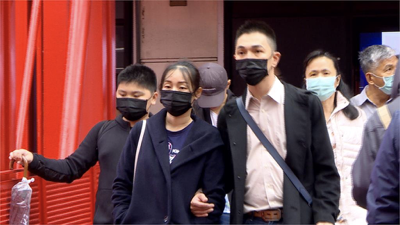

In [5]:
# This is image from the images folder.
Image.open("/kaggle/input/face-mask-detection/images/maksssksksss116.png")

In [6]:
with open('/kaggle/input/face-mask-detection/annotations/maksssksksss144.xml') as f:
    contents = f.read()
    print(contents)


<annotation>
    <folder>images</folder>
    <filename>maksssksksss144.png</filename>
    <size>
        <width>400</width>
        <height>217</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>130</xmin>
            <ymin>19</ymin>
            <xmax>155</xmax>
            <ymax>47</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>212</xmin>
            <ymin>56</ymin>
            <xmax>232</xmax>
            <ymax>79</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncat

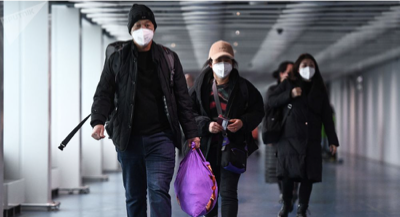

In [7]:
Image.open("/kaggle/input/face-mask-detection/images/maksssksksss144.png")

# 4| Preparaing Data

In [8]:
# Preparing Data For Model (YoloV11)
# These functions convert bounding box formats between XML (Pascal VOC) and YOLO.

def xml_to_yolo_bbox(bbox, w, h):
    """
    Convert bounding box from XML (Pascal VOC) format to YOLO format.

    Args:
        bbox (list): [xmin, ymin, xmax, ymax] in XML format.
        w (int): Width of the image.
        h (int): Height of the image.

    Returns:
        list: [x_center, y_center, width, height] in YOLO format (normalized).
    """
    # Calculate normalized x-center of the bounding box
    x_center = ((bbox[2] + bbox[0]) / 2) / w
    # Calculate normalized y-center of the bounding box
    y_center = ((bbox[3] + bbox[1]) / 2) / h
    # Calculate normalized width of the bounding box
    width = (bbox[2] - bbox[0]) / w
    # Calculate normalized height of the bounding box
    height = (bbox[3] - bbox[1]) / h

    return [x_center, y_center, width, height]


def yolo_to_xml_bbox(bbox, w, h):
    """
    Convert bounding box from YOLO format to XML (Pascal VOC) format.

    Args:
        bbox (list): [x_center, y_center, width, height] in YOLO format (normalized).
        w (int): Width of the image.
        h (int): Height of the image.

    Returns:
        list: [xmin, ymin, xmax, ymax] in XML format.
    """
    # Calculate half-length of the bounding box width
    w_half_len = (bbox[2] * w) / 2  # bbox[2] is normalized width
    # Calculate half-length of the bounding box height
    h_half_len = (bbox[3] * h) / 2  # bbox[3] is normalized height

    # Calculate xmin (left boundary of the bounding box)
    xmin = int((bbox[0] * w) - w_half_len)  # bbox[0] is normalized x_center
    # Calculate ymin (top boundary of the bounding box)
    ymin = int((bbox[1] * h) - h_half_len)  # bbox[1] is normalized y_center
    # Calculate xmax (right boundary of the bounding box)
    xmax = int((bbox[0] * w) + w_half_len)
    # Calculate ymax (bottom boundary of the bounding box)
    ymax = int((bbox[1] * h) + h_half_len)

    return [xmin, ymin, xmax, ymax]

In [9]:
import os
import glob
import xml.etree.ElementTree as ET

# Function to convert XML bounding box (Pascal VOC) to YOLO format
def xml_to_yolo_bbox(bbox, w, h):
    """
    Convert Pascal VOC bounding box format (xmin, ymin, xmax, ymax) 
    to YOLO format (x_center, y_center, width, height), normalized by image size.
    
    Args:
        bbox (list): Bounding box in XML format [xmin, ymin, xmax, ymax].
        w (int): Image width.
        h (int): Image height.

    Returns:
        list: YOLO formatted bounding box [x_center, y_center, width, height].
    """
    x_center = ((bbox[0] + bbox[2]) / 2) / w  # Normalize x center
    y_center = ((bbox[1] + bbox[3]) / 2) / h  # Normalize y center
    width = (bbox[2] - bbox[0]) / w  # Normalize width
    height = (bbox[3] - bbox[1]) / h  # Normalize height
    return [x_center, y_center, width, height]

# Define paths for input annotations, images, and output labels
input_dir = '/kaggle/input/face-mask-detection/annotations'  # XML annotation files
output_dir = '/kaggle/working/labels'  # Output directory for YOLO labels
image_dir = '/kaggle/input/face-mask-detection/images'  # Directory containing images

# Ensure output directory exists
if not os.path.exists(output_dir):
    os.makedirs(output_dir, exist_ok=True)

# List all XML annotation files
files = glob.glob(os.path.join(input_dir, '*.xml'))

# List to store class names dynamically
classes = []

# Iterate through all XML annotation files
for fil in files:
    basename = os.path.basename(fil)  # Extract filename from path
    filename = os.path.splitext(basename)[0]  # Remove extension to get image name
    
    # Check if the corresponding image exists (assuming images are .png)
    if not os.path.exists(os.path.join(image_dir, f'{filename}.png')):
        print(f'{filename}.png image does not exist, skipping...')
        continue  # Skip XML file if image is missing
    
    result = []  # List to store YOLO formatted bounding box data
    
    try:
        tree = ET.parse(fil)  # Parse XML file
        root = tree.getroot()
    except ET.ParseError:
        print(f"Error parsing {fil}, skipping...")
        continue  # Skip corrupted XML files
    
    # Extract image width and height from XML file
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    
    # Iterate through each object in the XML file
    for obj in root.findall('object'):
        label = obj.find('name').text  # Get class label
        
        # Add class to list if not already present
        if label not in classes:
            classes.append(label)
        
        index = classes.index(label)  # Get index of class for YOLO format
        
        # Extract bounding box coordinates from XML file
        bndbox = obj.find('bndbox')
        pil_bbox = [
            int(bndbox.find('xmin').text),
            int(bndbox.find('ymin').text),
            int(bndbox.find('xmax').text),
            int(bndbox.find('ymax').text)
        ]
        
        # Convert bounding box to YOLO format
        yolo_bbox = xml_to_yolo_bbox(pil_bbox, width, height)
        
        # Format bounding box as a YOLO annotation string
        bbox_string = ' '.join([f"{x:.6f}" for x in [index] + yolo_bbox])
        
        # Append formatted bounding box data to results list
        result.append(bbox_string)
    
    # Write YOLO label file only if objects exist in the image
    if result:
        with open(os.path.join(output_dir, f'{filename}.txt'), 'w', encoding='utf-8') as f:
            f.write('\n'.join(result))

# Save class names in "classes.txt" (used for YOLO training)
with open(os.path.join(output_dir, 'classes.txt'), 'w', encoding='utf-8') as f:
    f.write('\n'.join(classes))

In [10]:
# Open the 'classes.txt' file in read mode
with open(f'{output_dir}/classes.txt') as f:
    # Read the entire content of the file
    contents = f.read()
    
    # Print the contents of 'classes.txt' to the console
    print(contents)

with_mask
mask_weared_incorrect
without_mask


In [11]:
# .xml format
with open("/kaggle/input/face-mask-detection/annotations/maksssksksss174.xml") as f:
    contents = f.read()
    print(contents)


<annotation>
    <folder>images</folder>
    <filename>maksssksksss174.png</filename>
    <size>
        <width>400</width>
        <height>272</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>44</xmin>
            <ymin>63</ymin>
            <xmax>95</xmax>
            <ymax>117</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>102</xmin>
            <ymin>60</ymin>
            <xmax>142</xmax>
            <ymax>104</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncat

In [12]:
# .txt format
with open("/kaggle/working/labels/maksssksksss174.txt") as f:
    contents = f.read()
    print(contents)

0.000000 0.173750 0.330882 0.127500 0.198529
0.000000 0.305000 0.301471 0.100000 0.161765
0.000000 0.557500 0.264706 0.135000 0.205882
0.000000 0.928750 0.286765 0.102500 0.176471


In [13]:
# Count the number of annotation files in the annotations directory
annotation_count = len(os.listdir("/kaggle/input/face-mask-detection/annotations"))

# Count the number of label files in the labels directory
labels_count = len(os.listdir("/kaggle/working/labels"))

# Print the total number of annotation files
print(f"Annotation Counts: {annotation_count}")

# Print the total number of label files
print(f"Labels Counts: {labels_count}")

Annotation Counts: 853
Labels Counts: 854


# 5| Preparing Training Data

In [14]:
# Create a folder of train dataset
if not os.path.isfile("/kaggle/working/data"):
    os.mkdir('/kaggle/working/data')
    os.mkdir('/kaggle/working/data/train')
    os.mkdir('/kaggle/working/data/val')
    os.mkdir('/kaggle/working/data/test')
    os.mkdir('/kaggle/working/data/train/images')
    os.mkdir('/kaggle/working/data/train/labels')
    os.mkdir('/kaggle/working/data/test/images')
    os.mkdir('/kaggle/working/data/test/labels')
    os.mkdir('/kaggle/working/data/val/images')
    os.mkdir('/kaggle/working/data/val/labels')

In [15]:
# Material is the names of images in the images folder.
metarial = []
for i in os.listdir("/kaggle/input/face-mask-detection/images"):
    str = i[:-4]
    metarial.append(str)

metarial[0:10]

['maksssksksss810',
 'maksssksksss848',
 'maksssksksss145',
 'maksssksksss825',
 'maksssksksss30',
 'maksssksksss323',
 'maksssksksss805',
 'maksssksksss613',
 'maksssksksss315',
 'maksssksksss295']

In [16]:
print("Sum of image: ", len(metarial))
train_size = int(len(metarial) * 0.7)
test_size = int(len(metarial) * 0.15)
val_size = int(len(metarial) * 0.15)
print("Sum of the train size: ", train_size)
print("Sum of the test size: ", test_size)
print("Sum of the val size: ", val_size)

Sum of image:  853
Sum of the train size:  597
Sum of the test size:  127
Sum of the val size:  127


In [17]:
import shutil

# Function to prepare and distribute data into train, test, and validation folders for YOLOv1.1
def preparinbdata(main_txt_file, main_img_file, train_size, test_size, val_size):
    # Copy training data (txt and images) into train folders
    for i in range(0, train_size):
        # Define source paths for the current text and image file
        source_txt = main_txt_file + "/" + metarial[i] + ".txt"
        source_img = main_img_file + "/" + metarial[i] + ".png"
        
        # Define the target paths for the train set (labels and images)
        mstring = metarial[i]
        train_destination_txt = "/kaggle/working/data/train/labels" + "/" + metarial[i] + ".txt"
        train_destination_png = "/kaggle/working/data/train/images" + "/" + metarial[i] + ".png"
        
        # Copy the source txt and image files to the train destination directories
        shutil.copy(source_txt, train_destination_txt)
        shutil.copy(source_img, train_destination_png)

    # Copy test data (txt and images) into test folders
    for l in range(train_size, train_size + test_size):
        # Define source paths for the current test text and image file
        source_txt = main_txt_file + "/" + metarial[l] + ".txt"
        source_img = main_img_file + "/" + metarial[l] + ".png"

        # Define the target paths for the test set (labels and images)
        mstring = metarial[l]
        test_destination_txt = "/kaggle/working/data/test/labels" + "/" + metarial[l] + ".txt"
        test_destination_png = "/kaggle/working/data/test/images" + "/" + metarial[l] + ".png"

        # Copy the source txt and image files to the test destination directories
        shutil.copy(source_txt, test_destination_txt)
        shutil.copy(source_img, test_destination_png)

    # Copy validation data (txt and images) into validation folders
    for n in range(train_size + test_size, train_size + test_size + val_size):
        # Define source paths for the current validation text and image file
        source_txt = main_txt_file + "/" + metarial[n] + ".txt"
        source_img = main_img_file + "/" + metarial[n] + ".png"

        # Define the target paths for the validation set (labels and images)
        mstring = metarial[n]
        val_destination_txt = "/kaggle/working/data/val/labels" + "/" + metarial[n] + ".txt"
        val_destination_png = "/kaggle/working/data/val/images" + "/" + metarial[n] + ".png"

        # Copy the source txt and image files to the validation destination directories
        shutil.copy(source_txt, val_destination_txt)
        shutil.copy(source_img, val_destination_png)

In [18]:
#preparinbdata("/kaggle/working/labels", "/kaggle/input/face-mask-detection/images", 597, 127, 127)
preparinbdata(main_txt_file = "/kaggle/working/labels", 
              main_img_file = "/kaggle/input/face-mask-detection/images",
              train_size = train_size,
              test_size = test_size, 
              val_size = val_size)

In [19]:
# Create the data.yaml. I am going to use it on the train with yolov9.
yaml_text = """train: /kaggle/working/data/train/images/
val: /kaggle/working/data/val/images/

nc: 3
names: ["with_mask", "mask_weared_incorrect", "without_mask"]"""

with open("/kaggle/working/data/data.yaml", 'w') as file:
    file.write(yaml_text)

In [20]:
with open("/kaggle/working/data/data.yaml") as f:
    contents = f.read()
    print(contents)

train: /kaggle/working/data/train/images/
val: /kaggle/working/data/val/images/

nc: 3
names: ["with_mask", "mask_weared_incorrect", "without_mask"]


# 6| Modeling YOLOV11

In [21]:
# We should close wandb because If we don't close wandb we can't start training.
import wandb
wandb.init(mode='disabled')

In [22]:
# Training 
from ultralytics import YOLO

model = YOLO('yolo11n.pt')

results = model.train(data="/kaggle/working/data/data.yaml", epochs=50, imgsz=640, save = True, device = [0])

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 107MB/s]


Ultralytics 8.3.69 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/working/data/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=[0], workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=T

100%|██████████| 755k/755k [00:00<00:00, 24.0MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/data/train/labels... 597 images, 0 backgrounds, 0 corrupt: 100%|██████████| 597/597 [00:01<00:00, 440.57it/s]

train: New cache created: /kaggle/working/data/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/data/val/labels... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<00:00, 479.90it/s]

val: New cache created: /kaggle/working/data/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       3.1G      1.806      3.041      1.397         46        640: 100%|██████████| 38/38 [00:10<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.61it/s]

                   all        127        651     0.0174      0.591      0.264      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.74G      1.406      1.618      1.061         33        640: 100%|██████████| 38/38 [00:08<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.02it/s]

                   all        127        651      0.878       0.15      0.254      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       2.9G      1.279      1.377      1.062         38        640: 100%|██████████| 38/38 [00:08<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.35it/s]

                   all        127        651      0.933      0.207      0.305       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.78G      1.271       1.22      1.055         17        640: 100%|██████████| 38/38 [00:08<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.43it/s]

                   all        127        651      0.497      0.377      0.418      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.84G      1.237      1.145      1.039         33        640: 100%|██████████| 38/38 [00:08<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.61it/s]


                   all        127        651      0.498      0.516      0.522      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.81G      1.233      1.094      1.037         53        640: 100%|██████████| 38/38 [00:08<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.53it/s]


                   all        127        651      0.874      0.464      0.554      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.69G      1.184      1.013      1.019         40        640: 100%|██████████| 38/38 [00:08<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.43it/s]


                   all        127        651      0.646      0.607      0.636      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.96G      1.188     0.9868      1.026         29        640: 100%|██████████| 38/38 [00:08<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.11it/s]

                   all        127        651      0.678      0.628      0.618      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.88G       1.19     0.9522      1.025         41        640: 100%|██████████| 38/38 [00:08<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.64it/s]


                   all        127        651      0.547      0.665      0.622      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.69G      1.162     0.9277       1.01         46        640: 100%|██████████| 38/38 [00:08<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.49it/s]


                   all        127        651      0.791      0.595      0.651      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.39G      1.137     0.8956      1.005         29        640: 100%|██████████| 38/38 [00:08<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.86it/s]


                   all        127        651       0.67       0.62      0.646        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.83G       1.13     0.8671      1.001         29        640: 100%|██████████| 38/38 [00:08<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.91it/s]

                   all        127        651      0.738      0.587      0.639      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.83G      1.127     0.8321     0.9943         30        640: 100%|██████████| 38/38 [00:08<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.95it/s]

                   all        127        651       0.78      0.573      0.635      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.82G      1.122     0.8034      1.002         27        640: 100%|██████████| 38/38 [00:08<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.99it/s]

                   all        127        651      0.743      0.581      0.668      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.71G      1.127     0.7891     0.9943         19        640: 100%|██████████| 38/38 [00:08<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.91it/s]

                   all        127        651      0.768      0.646      0.717      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.89G      1.141     0.8083     0.9946         23        640: 100%|██████████| 38/38 [00:08<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.88it/s]

                   all        127        651      0.731      0.673      0.718      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.94G      1.096     0.7652     0.9821         44        640: 100%|██████████| 38/38 [00:08<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.15it/s]

                   all        127        651      0.867      0.623      0.724      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.68G      1.083     0.7526     0.9804         94        640: 100%|██████████| 38/38 [00:08<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.93it/s]

                   all        127        651       0.76      0.593      0.682      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.73G      1.107     0.7349     0.9871         39        640: 100%|██████████| 38/38 [00:08<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.91it/s]

                   all        127        651      0.732      0.712      0.735      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.81G      1.086      0.725     0.9809         28        640: 100%|██████████| 38/38 [00:08<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.00it/s]

                   all        127        651      0.702      0.694      0.746      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.67G      1.054     0.7048     0.9647         52        640: 100%|██████████| 38/38 [00:08<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.05it/s]

                   all        127        651      0.749      0.675      0.728      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.71G      1.068     0.7131      0.973          9        640: 100%|██████████| 38/38 [00:08<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.79it/s]


                   all        127        651      0.863      0.595      0.702      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.86G      1.049     0.6899     0.9744         29        640: 100%|██████████| 38/38 [00:08<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.99it/s]

                   all        127        651      0.819      0.722      0.805      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.87G      1.055     0.6727     0.9643         25        640: 100%|██████████| 38/38 [00:08<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.68it/s]


                   all        127        651      0.775      0.727      0.777      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.89G      1.058     0.6722     0.9703         22        640: 100%|██████████| 38/38 [00:08<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.10it/s]

                   all        127        651      0.725      0.772      0.761      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.89G      1.025     0.6465     0.9577         68        640: 100%|██████████| 38/38 [00:08<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.75it/s]

                   all        127        651      0.716      0.651      0.707      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.88G      1.033      0.649     0.9615         31        640: 100%|██████████| 38/38 [00:08<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.97it/s]

                   all        127        651      0.696      0.733      0.737      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.75G      1.032     0.6483     0.9587         64        640: 100%|██████████| 38/38 [00:08<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.07it/s]

                   all        127        651       0.68      0.663       0.68      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.84G      1.007     0.6135     0.9533         38        640: 100%|██████████| 38/38 [00:08<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.88it/s]

                   all        127        651      0.808      0.767      0.783      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.71G      1.018     0.6242     0.9594         55        640: 100%|██████████| 38/38 [00:08<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.00it/s]

                   all        127        651      0.848      0.705      0.793      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.66G      1.018     0.6053     0.9519         56        640: 100%|██████████| 38/38 [00:08<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.97it/s]

                   all        127        651      0.835      0.724      0.786       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.84G      1.018     0.6098     0.9531         16        640: 100%|██████████| 38/38 [00:08<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.93it/s]

                   all        127        651      0.914      0.697      0.814      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.81G     0.9807     0.5829     0.9514         36        640: 100%|██████████| 38/38 [00:08<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.98it/s]

                   all        127        651      0.929      0.713      0.827      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.67G      0.989     0.5838     0.9428         28        640: 100%|██████████| 38/38 [00:08<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.16it/s]

                   all        127        651      0.766      0.788      0.807      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.86G     0.9847     0.5922     0.9363         26        640: 100%|██████████| 38/38 [00:08<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.81it/s]


                   all        127        651      0.841       0.72      0.797      0.533

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.82G      0.972     0.5687      0.946         24        640: 100%|██████████| 38/38 [00:08<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.70it/s]

                   all        127        651      0.845      0.717      0.799       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.01G      0.986     0.5808     0.9336         79        640: 100%|██████████| 38/38 [00:08<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.72it/s]


                   all        127        651      0.832      0.775      0.791      0.523

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.71G     0.9496     0.5595     0.9312         43        640: 100%|██████████| 38/38 [00:08<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.71it/s]

                   all        127        651      0.916       0.68      0.788      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.88G     0.9867     0.5708     0.9425        102        640: 100%|██████████| 38/38 [00:08<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.62it/s]

                   all        127        651      0.879      0.711      0.809      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       2.9G     0.9442     0.5609     0.9294         15        640: 100%|██████████| 38/38 [00:08<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.94it/s]

                   all        127        651      0.849      0.733      0.815      0.555


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.77G     0.9421     0.5409     0.9248         41        640: 100%|██████████| 38/38 [00:09<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.23it/s]

                   all        127        651      0.874      0.708      0.783      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       2.7G     0.9306     0.5167     0.9086         15        640: 100%|██████████| 38/38 [00:08<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.82it/s]

                   all        127        651      0.847      0.702      0.777      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.75G      0.937     0.5078      0.914         84        640: 100%|██████████| 38/38 [00:08<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.17it/s]

                   all        127        651      0.873      0.697      0.799      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.73G     0.9087      0.503     0.9101         28        640: 100%|██████████| 38/38 [00:08<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.96it/s]

                   all        127        651      0.771      0.715      0.782      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.76G     0.8951     0.4941     0.9122         10        640: 100%|██████████| 38/38 [00:08<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.34it/s]


                   all        127        651      0.853      0.732      0.813      0.561

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.72G      0.908     0.4944     0.9125         19        640: 100%|██████████| 38/38 [00:08<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.94it/s]

                   all        127        651      0.853      0.711      0.822      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.82G     0.8962     0.4816     0.9054         20        640: 100%|██████████| 38/38 [00:08<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.33it/s]

                   all        127        651      0.854      0.727       0.82      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.67G     0.8813     0.4789     0.8984         16        640: 100%|██████████| 38/38 [00:08<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]

                   all        127        651      0.887      0.708      0.814      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.71G     0.8964     0.4816     0.9094         20        640: 100%|██████████| 38/38 [00:08<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.16it/s]

                   all        127        651       0.87      0.731      0.813      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.73G     0.8819      0.469     0.9085         17        640: 100%|██████████| 38/38 [00:08<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.89it/s]

                   all        127        651      0.872      0.739      0.814       0.56



50 epochs completed in 0.143 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.69 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]


                   all        127        651      0.854      0.728       0.82      0.566
             with_mask        116        500      0.947      0.828      0.926      0.634
 mask_weared_incorrect         19         24      0.727      0.583      0.675      0.519
          without_mask         51        127      0.887      0.772       0.86      0.545


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/train


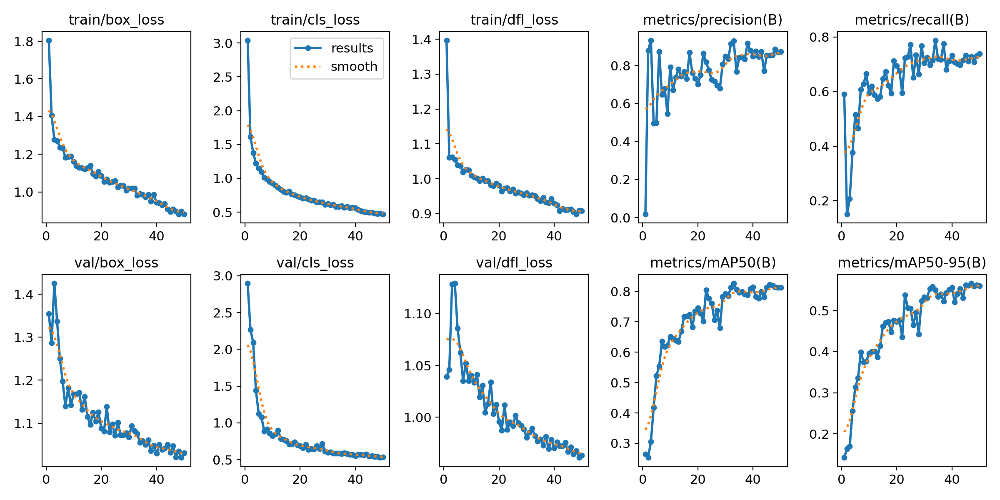

In [23]:
# Training result image
Image.open("/kaggle/working/runs/detect/train/results.png")

The values ​​in the result image are stable and in this 50-step training we performed, there were decreases in train_loss and val_loss values, which is a good situation. At the same time, the increase in metrics_precision, recall, mAP50, and mAP50-95 values ​​is also a good situation.

Detailed Analysis of the Graphs

* Train Loss:

       * Box Loss: Represents the error rate in predicting the bounding boxes of objects. As training progresses, this value generally decreases, indicating that your model is becoming better at predicting the locations of objects.

      * Cls Loss: Represents the error rate in classifying objects. This value also decreases as training progresses, indicating that your model is becoming better at correctly classifying objects.
  
      * Dfl Loss: This loss function represents the error rate in predicting the size and shape of objects. The decrease in dfl loss as training progresses indicates that your model is becoming better at predicting the size of objects.

  
* Validation Loss: Used to evaluate the generalizability of the results obtained on the training set on a previously unseen dataset (validation set). It is normal for the validation loss to be higher than the training loss, but the difference between the two is expected to decrease as training progresses. This is generally observed in the graphs.

* Metrics:

      * Precision: Represents the ratio of true positive predictions to total positive predictions. A high precision value indicates that the model has few false positive predictions.

  
      * Recall: Represents the ratio of true positive predictions to all actual positive examples. A high recall value indicates that the model is able to correctly find most of the true positive examples.

  
      * mAP (Mean Average Precision): It is the average of the average precision values calculated at different IoU (Intersection over Union) thresholds. The mAP value is a comprehensive metric used to evaluate the overall performance of the model. The increase in mAP50 and mAP50-95 values as training progresses indicates that your model's object detection performance is improving.

# 7| Detection with example images

In [24]:
# We will perform the detection process using the weights that the model we trained achieved the best result in 50 steps of training.
model_predict = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

In [25]:
# Detection 0
model_predict.predict("/kaggle/working/data/test/images/maksssksksss451.png", save=True)


image 1/1 /kaggle/working/data/test/images/maksssksksss451.png: 448x640 9 with_masks, 5 without_masks, 42.8ms
Speed: 1.8ms preprocess, 42.8ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'with_mask', 1: 'mask_weared_incorrect', 2: 'without_mask'}
 obb: None
 orig_img: array([[[156, 156, 187],
         [ 34,  35,  54],
         [ 11,  15,  23],
         ...,
         [ 85,  67, 104],
         [ 89,  71, 109],
         [ 88,  70, 109]],
 
        [[182, 181, 212],
         [ 50,  50,  67],
         [ 12,  14,  19],
         ...,
         [ 81,  66,  96],
         [ 83,  68, 101],
         [ 83,  68, 103]],
 
        [[185, 185, 216],
         [ 94,  94, 110],
         [  6,   7,  10],
         ...,
         [ 73,  64,  77],
         [ 73,  63,  82],
         [ 76,  66,  89]],
 
        ...,
 
        [[ 40,  58,  98],
         [ 41,  58, 100],
         [ 43,  57, 100],
         ...,
         [ 27,  26,  28],
         [ 20,  15,  16],
         [ 13,   8,   9]],
 
        [[ 36,  57,  93],
         [ 39,  57,  96],
        

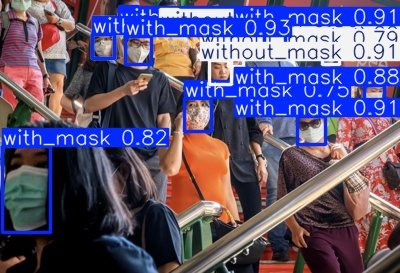

In [26]:
# Detection 0 Result
Image.open("/kaggle/working/runs/detect/predict/maksssksksss451.jpg")

In [27]:
# Download Image
!wget "https://onecms-res.cloudinary.com/image/upload/s--XV7DHKzY--/c_fill,g_auto,h_468,w_830/f_auto,q_auto/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A"

--2025-01-29 17:42:16--  https://onecms-res.cloudinary.com/image/upload/s--XV7DHKzY--/c_fill,g_auto,h_468,w_830/f_auto,q_auto/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A
Resolving onecms-res.cloudinary.com (onecms-res.cloudinary.com)... 151.101.65.137, 151.101.1.137, 151.101.129.137, ...
Connecting to onecms-res.cloudinary.com (onecms-res.cloudinary.com)|151.101.65.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44288 (43K) [image/jpeg]
Saving to: ‘people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A’

people-wearing-mask 100%[===================>]  43.25K  --.-KB/s    in 0.007s  

2025-01-29 17:42:16 (5.97 MB/s) - ‘people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A’ saved [44288/44288]



In [28]:
# Rename image
os.rename("/kaggle/working/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A", "image.jpg")

In [29]:
# Detection 1
model_predict.predict("/kaggle/working/image.jpg", save=True)


image 1/1 /kaggle/working/image.jpg: 384x640 2 with_masks, 4 without_masks, 50.8ms
Speed: 2.3ms preprocess, 50.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'with_mask', 1: 'mask_weared_incorrect', 2: 'without_mask'}
 obb: None
 orig_img: array([[[ 41,  52,  50],
         [ 41,  52,  50],
         [ 38,  51,  49],
         ...,
         [156, 145, 131],
         [147, 136, 122],
         [141, 130, 116]],
 
        [[ 41,  52,  50],
         [ 41,  52,  50],
         [ 38,  51,  49],
         ...,
         [155, 144, 130],
         [146, 135, 121],
         [139, 128, 114]],
 
        [[ 41,  52,  50],
         [ 41,  52,  50],
         [ 38,  51,  49],
         ...,
         [153, 142, 128],
         [144, 133, 119],
         [137, 126, 112]],
 
        ...,
 
        [[227, 197, 180],
         [227, 197, 180],
         [226, 196, 179],
         ...,
         [147, 145, 144],
         [143, 141, 140],
         [140, 138, 137]],
 
        [[227, 197, 180],
         [227, 197, 180],
        

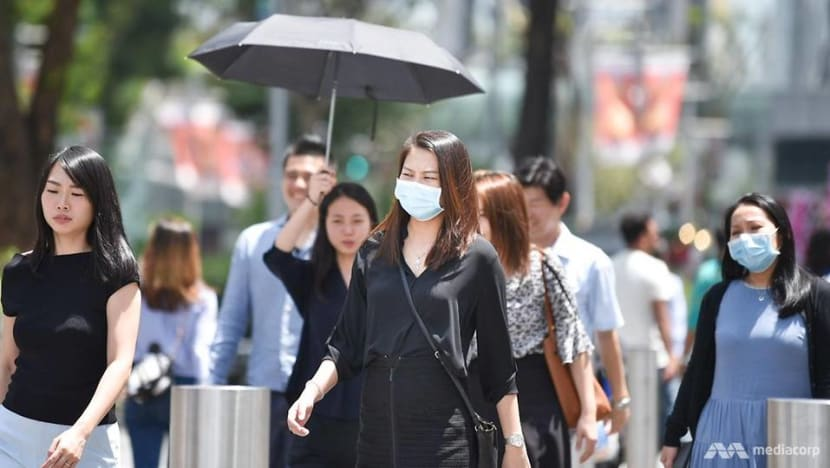

In [30]:
# Original image
Image.open("/kaggle/working/image.jpg")

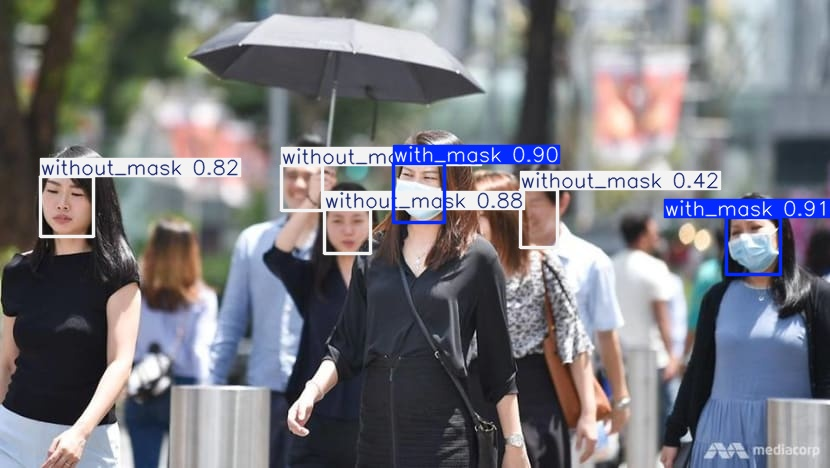

In [31]:
# Detection 1 Result
Image.open("/kaggle/working/runs/detect/predict/image.jpg")

In [32]:
# Download Image
!wget "https://static1.straitstimes.com.sg/s3fs-public/articles/2022/03/29/af_unmask_290322.jpg?VersionId=rPtitOtIiIRPLsuODzI9CHaCabNQWpQu"

--2025-01-29 17:42:19--  https://static1.straitstimes.com.sg/s3fs-public/articles/2022/03/29/af_unmask_290322.jpg?VersionId=rPtitOtIiIRPLsuODzI9CHaCabNQWpQu
Resolving static1.straitstimes.com.sg (static1.straitstimes.com.sg)... 104.18.27.62, 104.18.26.62, 2606:4700::6812:1b3e, ...
Connecting to static1.straitstimes.com.sg (static1.straitstimes.com.sg)|104.18.27.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 409120 (400K) [image/jpeg]
Saving to: ‘af_unmask_290322.jpg?VersionId=rPtitOtIiIRPLsuODzI9CHaCabNQWpQu’

af_unmask_290322.jp 100%[===================>] 399.53K  --.-KB/s    in 0.02s   

2025-01-29 17:42:19 (16.4 MB/s) - ‘af_unmask_290322.jpg?VersionId=rPtitOtIiIRPLsuODzI9CHaCabNQWpQu’ saved [409120/409120]



In [33]:
os.rename("af_unmask_290322.jpg?VersionId=rPtitOtIiIRPLsuODzI9CHaCabNQWpQu","image3.jpg")

In [34]:
# Detection 2
model_predict.predict("/kaggle/working/image3.jpg", save=True)


image 1/1 /kaggle/working/image3.jpg: 448x640 1 with_mask, 5 without_masks, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'with_mask', 1: 'mask_weared_incorrect', 2: 'without_mask'}
 obb: None
 orig_img: array([[[ 15,  41,  28],
         [ 15,  41,  28],
         [ 12,  40,  27],
         ...,
         [243, 234, 225],
         [223, 214, 205],
         [206, 197, 188]],
 
        [[ 11,  37,  24],
         [ 13,  39,  26],
         [ 14,  40,  27],
         ...,
         [250, 243, 234],
         [240, 230, 223],
         [229, 222, 213]],
 
        [[  9,  33,  21],
         [ 11,  37,  24],
         [ 15,  41,  28],
         ...,
         [234, 228, 221],
         [233, 224, 220],
         [229, 223, 216]],
 
        ...,
 
        [[118, 108, 108],
         [113, 103, 103],
         [106,  96,  96],
         ...,
         [ 58,  58,  58],
         [ 44,  44,  44],
         [ 37,  37,  37]],
 
        [[110, 100, 100],
         [105,  95,  95],
        

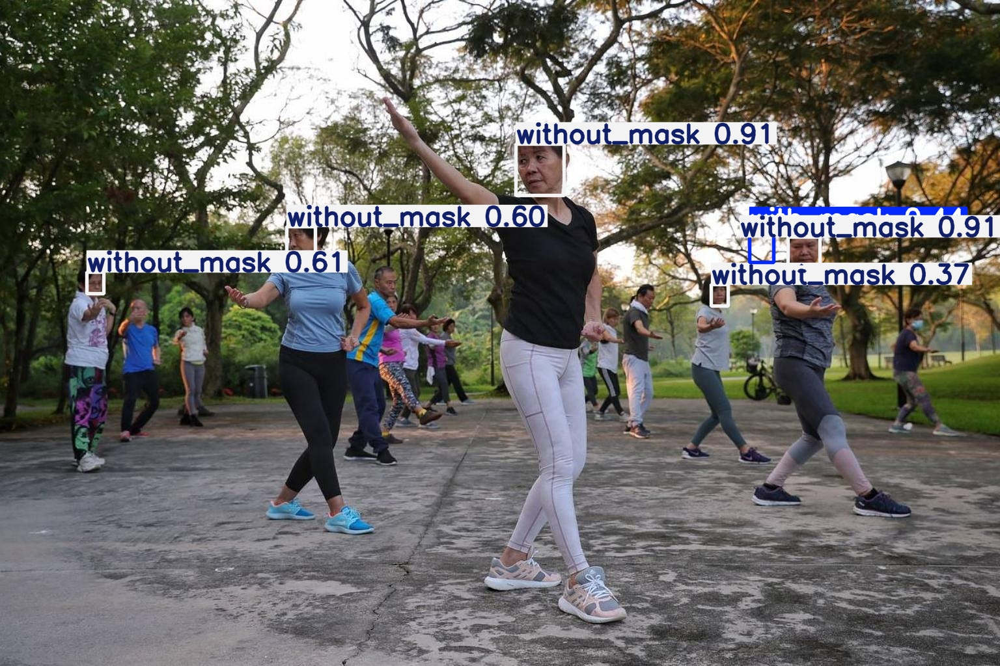

In [35]:
# Detection 2 Result
Image.open("/kaggle/working/runs/detect/predict/image3.jpg")

In [36]:
# Download Image
!wget "https://static1.straitstimes.com.sg/s3fs-public/articles/2022/03/29/dw-masks1-220329.jpg?VersionId=PlVArdJ8VMgxx6WJc0OUHscK4JY7.VCC"

--2025-01-29 17:42:22--  https://static1.straitstimes.com.sg/s3fs-public/articles/2022/03/29/dw-masks1-220329.jpg?VersionId=PlVArdJ8VMgxx6WJc0OUHscK4JY7.VCC
Resolving static1.straitstimes.com.sg (static1.straitstimes.com.sg)... 104.18.27.62, 104.18.26.62, 2606:4700::6812:1a3e, ...
Connecting to static1.straitstimes.com.sg (static1.straitstimes.com.sg)|104.18.27.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 207177 (202K) [image/jpeg]
Saving to: ‘dw-masks1-220329.jpg?VersionId=PlVArdJ8VMgxx6WJc0OUHscK4JY7.VCC’

dw-masks1-220329.jp 100%[===================>] 202.32K  --.-KB/s    in 0.01s   

2025-01-29 17:42:22 (13.6 MB/s) - ‘dw-masks1-220329.jpg?VersionId=PlVArdJ8VMgxx6WJc0OUHscK4JY7.VCC’ saved [207177/207177]



In [37]:
os.rename("dw-masks1-220329.jpg?VersionId=PlVArdJ8VMgxx6WJc0OUHscK4JY7.VCC","image4.jpg")

In [38]:
# Detection 3
model_predict.predict("/kaggle/working/image4.jpg", save=True)


image 1/1 /kaggle/working/image4.jpg: 448x640 3 with_masks, 8 without_masks, 12.5ms
Speed: 3.2ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'with_mask', 1: 'mask_weared_incorrect', 2: 'without_mask'}
 obb: None
 orig_img: array([[[226, 201, 191],
         [226, 201, 191],
         [226, 201, 191],
         ...,
         [244, 225, 218],
         [244, 225, 218],
         [244, 225, 218]],
 
        [[226, 201, 191],
         [226, 201, 191],
         [226, 201, 191],
         ...,
         [244, 225, 218],
         [244, 225, 218],
         [244, 225, 218]],
 
        [[226, 201, 191],
         [226, 201, 191],
         [226, 201, 191],
         ...,
         [244, 225, 218],
         [244, 225, 218],
         [244, 225, 218]],
 
        ...,
 
        [[ 67,  66,  75],
         [ 66,  65,  74],
         [ 64,  63,  72],
         ...,
         [ 64,  63,  65],
         [ 65,  64,  66],
         [ 66,  65,  67]],
 
        [[ 66,  65,  74],
         [ 66,  65,  74],
        

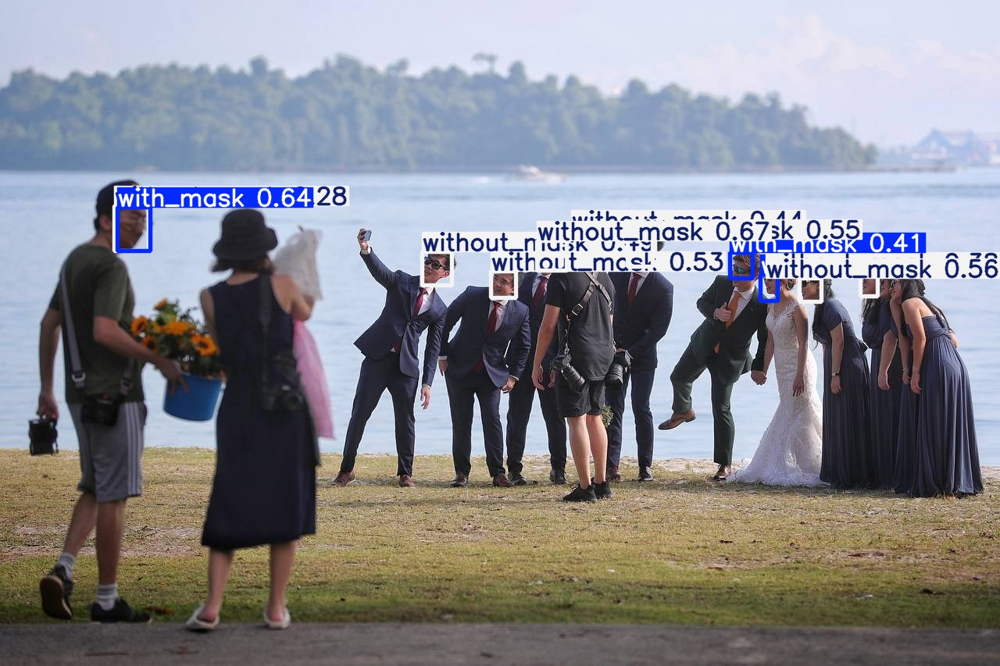

In [39]:
# Detection 3 Result
Image.open("/kaggle/working/runs/detect/predict/image4.jpg")

In [40]:
# Download Image
!wget "https://static1.straitstimes.com.sg/s3fs-public/articles/2022/03/29/hzppl290322.jpg?VersionId=629H2IINLwxDEMSd6UMcibYGO89AB46a"

--2025-01-29 17:42:25--  https://static1.straitstimes.com.sg/s3fs-public/articles/2022/03/29/hzppl290322.jpg?VersionId=629H2IINLwxDEMSd6UMcibYGO89AB46a
Resolving static1.straitstimes.com.sg (static1.straitstimes.com.sg)... 104.18.26.62, 104.18.27.62, 2606:4700::6812:1a3e, ...
Connecting to static1.straitstimes.com.sg (static1.straitstimes.com.sg)|104.18.26.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 332836 (325K) [image/jpeg]
Saving to: ‘hzppl290322.jpg?VersionId=629H2IINLwxDEMSd6UMcibYGO89AB46a’

hzppl290322.jpg?Ver 100%[===================>] 325.04K  --.-KB/s    in 0.02s   

2025-01-29 17:42:25 (13.1 MB/s) - ‘hzppl290322.jpg?VersionId=629H2IINLwxDEMSd6UMcibYGO89AB46a’ saved [332836/332836]



In [41]:
os.rename("hzppl290322.jpg?VersionId=629H2IINLwxDEMSd6UMcibYGO89AB46a","image2.jpg")

In [42]:
# Detection 4
model_predict.predict("/kaggle/working/image2.jpg", save=True)


image 1/1 /kaggle/working/image2.jpg: 448x640 1 with_mask, 1 mask_weared_incorrect, 4 without_masks, 13.2ms
Speed: 4.6ms preprocess, 13.2ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'with_mask', 1: 'mask_weared_incorrect', 2: 'without_mask'}
 obb: None
 orig_img: array([[[ 32,  30,  52],
         [ 31,  29,  51],
         [ 31,  29,  51],
         ...,
         [ 72,  72,  60],
         [ 76,  74,  63],
         [ 40,  39,  25]],
 
        [[ 33,  31,  53],
         [ 32,  30,  52],
         [ 32,  30,  52],
         ...,
         [ 80,  79,  69],
         [ 86,  84,  73],
         [ 56,  55,  41]],
 
        [[ 33,  31,  53],
         [ 33,  31,  53],
         [ 32,  30,  52],
         ...,
         [ 74,  75,  65],
         [ 79,  79,  67],
         [ 55,  55,  43]],
 
        ...,
 
        [[159, 148, 140],
         [155, 144, 136],
         [156, 145, 137],
         ...,
         [132, 122, 115],
         [132, 122, 115],
         [130, 120, 113]],
 
        [[158, 147, 139],
         [155, 144, 136],
        

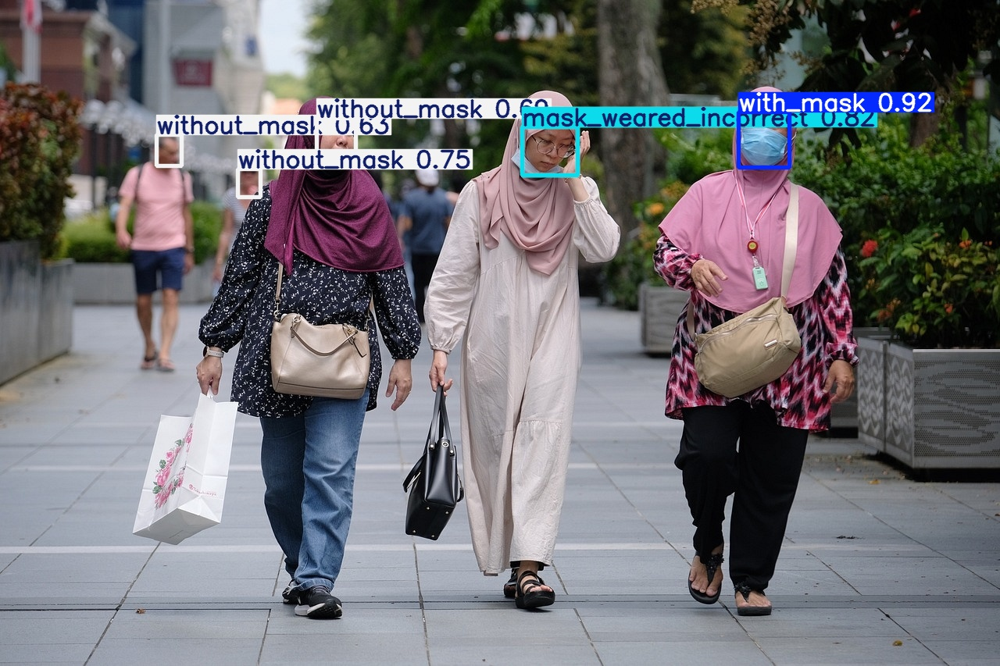

In [43]:
# Detection 4 Result
Image.open("/kaggle/working/runs/detect/predict/image2.jpg")

In [44]:
# Download Image
!wget "https://media.istockphoto.com/id/1225227131/photo/people-wearing-face-masks-on-the-first-weekend-of-the-unlockdown-in-lyon-france.webp?s=1024x1024&w=is&k=20&c=4nCr65lMfwKAwafGl081RsiNhipY3Bmyd7nCxDK-0iw="

--2025-01-29 17:42:29--  https://media.istockphoto.com/id/1225227131/photo/people-wearing-face-masks-on-the-first-weekend-of-the-unlockdown-in-lyon-france.webp?s=1024x1024&w=is&k=20&c=4nCr65lMfwKAwafGl081RsiNhipY3Bmyd7nCxDK-0iw=
Resolving media.istockphoto.com (media.istockphoto.com)... 3.163.165.18, 3.163.165.72, 3.163.165.44, ...
Connecting to media.istockphoto.com (media.istockphoto.com)|3.163.165.18|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 134128 (131K) [image/webp]
Saving to: ‘people-wearing-face-masks-on-the-first-weekend-of-the-unlockdown-in-lyon-france.webp?s=1024x1024&w=is&k=20&c=4nCr65lMfwKAwafGl081RsiNhipY3Bmyd7nCxDK-0iw=’

people-wearing-face 100%[===================>] 130.98K  --.-KB/s    in 0.02s   

2025-01-29 17:42:29 (8.53 MB/s) - ‘people-wearing-face-masks-on-the-first-weekend-of-the-unlockdown-in-lyon-france.webp?s=1024x1024&w=is&k=20&c=4nCr65lMfwKAwafGl081RsiNhipY3Bmyd7nCxDK-0iw=’ saved [134128/134128]



In [45]:
os.rename("people-wearing-face-masks-on-the-first-weekend-of-the-unlockdown-in-lyon-france.webp?s=1024x1024&w=is&k=20&c=4nCr65lMfwKAwafGl081RsiNhipY3Bmyd7nCxDK-0iw=","image5.jpg")

In [46]:
# Detection 5
model_predict.predict("/kaggle/working/image5.jpg", save=True)


image 1/1 /kaggle/working/image5.jpg: 448x640 12 with_masks, 5 without_masks, 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'with_mask', 1: 'mask_weared_incorrect', 2: 'without_mask'}
 obb: None
 orig_img: array([[[ 40,  63,  57],
         [ 40,  63,  57],
         [ 46,  68,  62],
         ...,
         [  3,  21, 122],
         [  3,  21, 122],
         [  3,  21, 122]],
 
        [[ 27,  50,  44],
         [ 45,  67,  61],
         [ 55,  78,  72],
         ...,
         [  3,  21, 122],
         [  3,  21, 122],
         [  3,  21, 122]],
 
        [[ 41,  64,  58],
         [ 18,  40,  35],
         [ 35,  58,  52],
         ...,
         [  3,  21, 122],
         [  3,  21, 122],
         [  3,  21, 122]],
 
        ...,
 
        [[231, 231, 231],
         [227, 227, 227],
         [227, 227, 227],
         ...,
         [125, 120, 121],
         [134, 130, 130],
         [147, 142, 143]],
 
        [[231, 231, 231],
         [225, 225, 225],
        

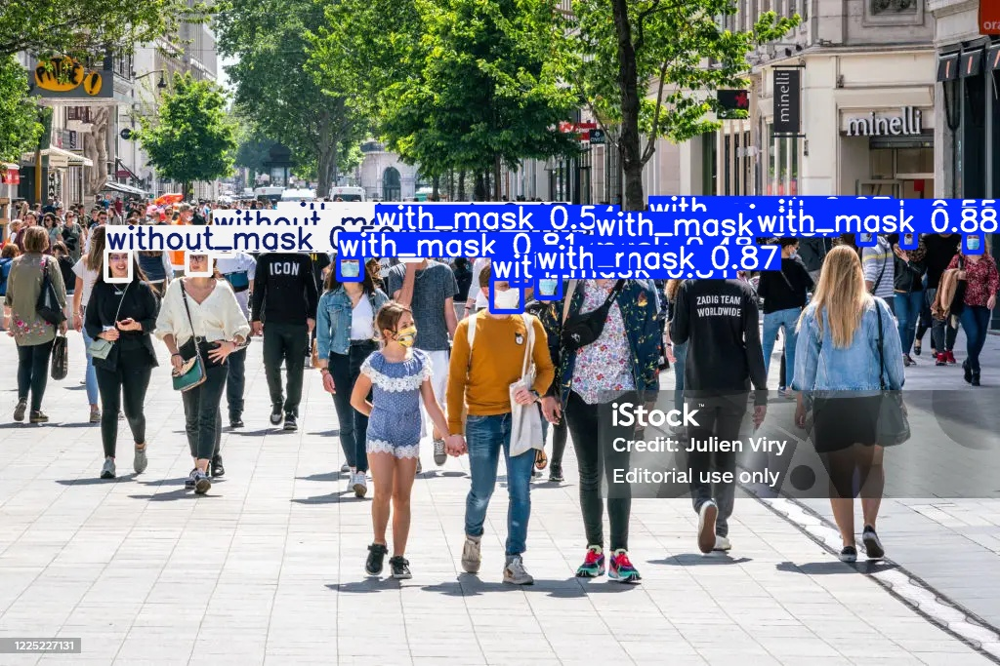

In [47]:
# Detection 5 Result
Image.open("/kaggle/working/runs/detect/predict/image5.jpg")

test data:
1) maksssksksss451.png link : /kaggle/working/data/test/images/maksssksksss451.png
   
2) people practing qigong in pasir ris park from straitstimes.com link : https://static1.straitstimes.com.sg/s3fs-public/articles/2022/03/29/af_unmask_290322.jpg?VersionId=rPtitOtIiIRPLsuODzI9CHaCabNQWpQu
   
3) weeding party from the same link : https://static1.straitstimes.com.sg/s3fs-public/articles/2022/03/29/dw-masks1-220329.jpg?VersionId=PlVArdJ8VMgxx6WJc0OUHscK4JY7.VCC

4) https://onecms-res.cloudinary.com/image/upload/s--XV7DHKzY--/c_fill,g_auto,h_468,w_830/f_auto,q_auto/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A

5) https://static1.straitstimes.com.sg/s3fs-public/articles/2022/03/29/hzppl290322.jpg?VersionId=629H2IINLwxDEMSd6UMcibYGO89AB46a

6) https://media.istockphoto.com/id/1225227131/photo/people-wearing-face-masks-on-the-first-weekend-of-the-unlockdown-in-lyon-france.webp?s=1024x1024&w=is&k=20&c=4nCr65lMfwKAwafGl081RsiNhipY3Bmyd7nCxDK-0iw=